Author: William Mwine <br>
Github: [willsketch](https://github.com/willsketch)

# DATA
The data used in this analysis was acquired from 10x Genomics. This was Gene expression data from healthy mouse kidney. The data used in this analysis was the 16 µm bin data with mean UMI counts per bin of 1859.3 and mean genes per bin of 1159.8. The reads were mapped to the mouse genome (mm10) with 10X Space Ranger. I could no unfortunately find corresponding sc-rna data <br>
The data and the metrics about this  data can be found at the link below:
> https://cf.10xgenomics.com/samples/spatial-exp/3.0.0/Visium_HD_Mouse_Kidney/Visium_HD_Mouse_Kidney_web_summary.html

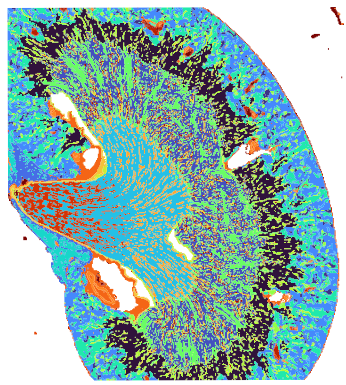

In [1]:
!ls data

binned_outputs	Visium_HD_Mouse_Kidney_binned_outputs.tar.gz


In [2]:
!pwd

/mnt/storage/r0993335/jupyternotebooks/project1


# Reading data

In [3]:
path_data = '/mnt/storage/r0993335/jupyternotebooks/project1/data/binned_outputs/square_016um/'
tissue_positions = f'{path_data}/spatial/tissue_positions.parquet'

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
from scipy.stats import median_abs_deviation

In [34]:
hd = sc.read_10x_h5(f'{path_data}/filtered_feature_bc_matrix.h5')
hd.var_names_make_unique()
hd

/usr/local/lib/python3.8/dist-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 126114 × 19059
    var: 'gene_ids', 'feature_types', 'genome'

In [35]:
hd.var

,gene_ids,feature_types,genome
Xkr4,ENSMUSG00000051951,Gene Expression,mm10
Rp1,ENSMUSG00000025900,Gene Expression,mm10
Sox17,ENSMUSG00000025902,Gene Expression,mm10
Lypla1,ENSMUSG00000025903,Gene Expression,mm10
Tcea1,ENSMUSG00000033813,Gene Expression,mm10
...,...,...,...
mt-Nd4,ENSMUSG00000064363,Gene Expression,mm10
mt-Nd5,ENSMUSG00000064367,Gene Expression,mm10
mt-Nd6,ENSMUSG00000064368,Gene Expression,mm10
mt-Cytb,ENSMUSG00000064370,Gene Expression,mm10


In [36]:
hd.obs

""
s_016um_00052_00082-1
s_016um_00396_00063-1
s_016um_00144_00175-1
s_016um_00297_00147-1
s_016um_00299_00088-1
...
s_016um_00375_00231-1
s_016um_00109_00223-1
s_016um_00039_00175-1
s_016um_00037_00193-1


In [37]:
# spatial metadata
hd_xy = pd.read_parquet(tissue_positions)
hd_xy

,barcode,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres
0,s_016um_00000_00000-1,0,0,0,26710.637439,4707.861596
1,s_016um_00000_00001-1,0,0,1,26710.474736,4766.283034
2,s_016um_00000_00002-1,0,0,2,26710.312033,4824.704478
3,s_016um_00000_00003-1,0,0,3,26710.149330,4883.125931
4,s_016um_00000_00004-1,0,0,4,26709.986626,4941.547390
...,...,...,...,...,...,...
175556,s_016um_00418_00414-1,0,418,414,2222.354923,28827.228515
175557,s_016um_00418_00415-1,0,418,415,2222.190670,28885.654349
175558,s_016um_00418_00416-1,0,418,416,2222.026417,28944.080191
175559,s_016um_00418_00417-1,0,418,417,2221.862163,29002.506040


In [38]:
hd.obs.index

Index(['s_016um_00052_00082-1', 's_016um_00396_00063-1',
       's_016um_00144_00175-1', 's_016um_00297_00147-1',
       's_016um_00299_00088-1', 's_016um_00347_00254-1',
       's_016um_00050_00315-1', 's_016um_00408_00217-1',
       's_016um_00225_00065-1', 's_016um_00036_00081-1',
       ...
       's_016um_00202_00345-1', 's_016um_00341_00000-1',
       's_016um_00212_00331-1', 's_016um_00288_00288-1',
       's_016um_00193_00227-1', 's_016um_00375_00231-1',
       's_016um_00109_00223-1', 's_016um_00039_00175-1',
       's_016um_00037_00193-1', 's_016um_00144_00329-1'],
      dtype='object', length=126114)

In [39]:
# Sort in same order as anndata object
hd_xy.set_index('barcode', inplace=True)
hd_xy = hd_xy.loc[hd.obs.index]

# Add spatial coordinates to anndata
spatial = hd_xy.loc[:, ['array_col', 'array_row']].to_numpy()
hd.obsm['spatial'] = spatial
hd

AnnData object with n_obs × n_vars = 126114 × 19059
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

## Visualization of data

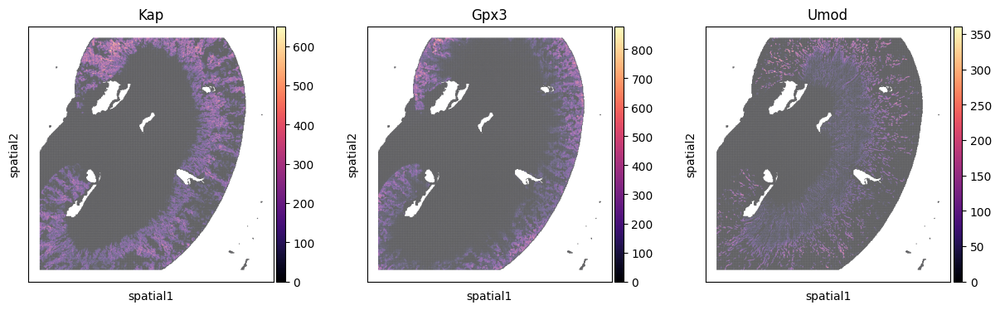

In [40]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4, 4)

sc.pl.spatial(hd, color=['Kap', 'Gpx3', 'Umod'], cmap='magma', spot_size=1)

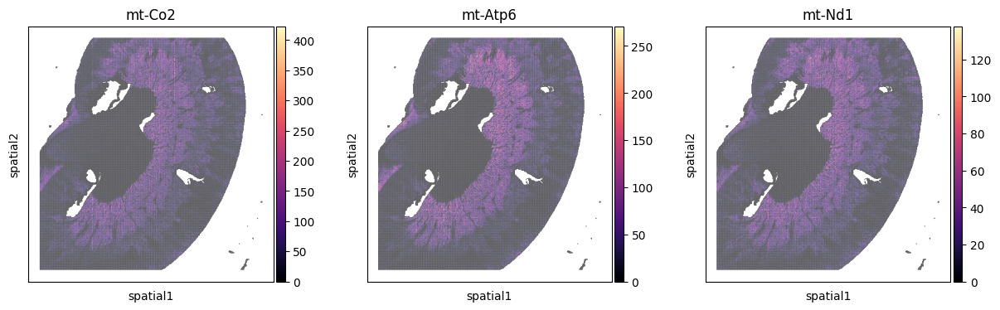

In [41]:
plt.rcParams["figure.figsize"] = (4, 4)

sc.pl.spatial(hd, color=['mt-Co2', 'mt-Atp6', 'mt-Nd1'], cmap='magma', spot_size=1)

## Qc and preprocessing
I compute standard quality control (QC) metrics using `sc.pp.calculate_qc_metrics` and visualize the results. To remove outliers, I use the Median Absolute Deviation (MAD) method. Specifically, I compute the MAD for each metric and exclude data points that fall outside the range `[median(M) − nmads ⋅ MAD, median(M) + nmads ⋅ MAD]`

where `M` is the metric of interest and `nmads` is 5.


In [42]:
hd.var["mt"] = hd.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(hd, qc_vars=["mt"], inplace=True)

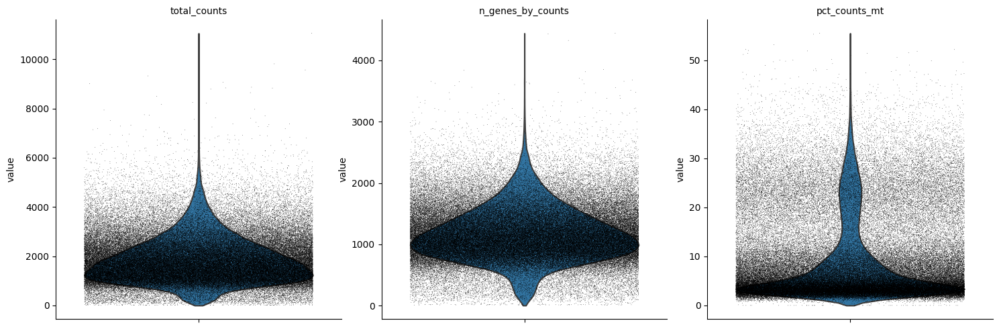

In [43]:
sc.pl.violin(hd, ['total_counts', 'n_genes_by_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, size=0.5)

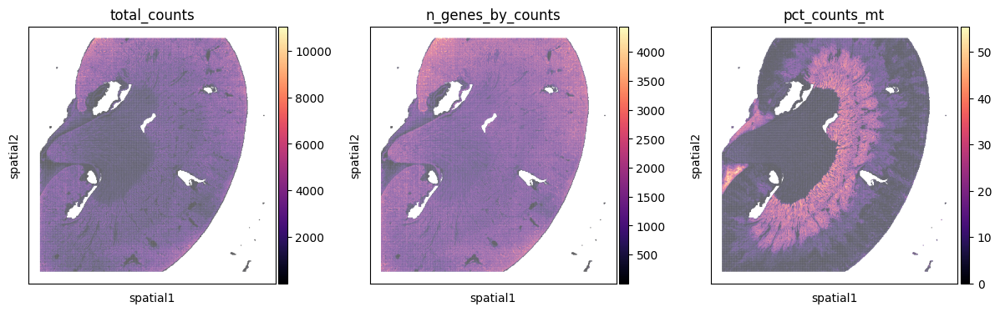

In [44]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.spatial(hd, color=["total_counts", "n_genes_by_counts", "pct_counts_mt"], cmap='magma', spot_size=1)

In [45]:
hd.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt
s_016um_00052_00082-1,1752,7.469084,3016.0,8.012018,23.474801,30.868700,40.251989,58.488064,82.0,4.418840,2.718833
s_016um_00396_00063-1,902,6.805723,1342.0,7.202661,26.378539,35.543964,47.690015,70.044709,72.0,4.290460,5.365127
s_016um_00144_00175-1,965,6.873164,1244.0,7.126891,19.372990,27.411576,38.504823,62.620579,54.0,4.007333,4.340836
s_016um_00297_00147-1,1357,7.213768,2438.0,7.799344,34.700574,41.099262,49.753897,64.848236,524.0,6.263398,21.493027
s_016um_00299_00088-1,859,6.756932,1178.0,7.072422,27.249576,35.568761,44.057725,69.524618,213.0,5.365976,18.081493
...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00375_00231-1,1093,6.997596,1878.0,7.538495,27.955272,36.847710,48.828541,68.423855,64.0,4.174387,3.407881
s_016um_00109_00223-1,760,6.634633,1101.0,7.004882,30.881017,39.963669,49.137148,76.385104,215.0,5.375278,19.527702
s_016um_00039_00175-1,1522,7.328437,2220.0,7.705713,21.486486,27.567568,36.576577,53.963964,266.0,5.587249,11.981982
s_016um_00037_00193-1,759,6.633318,867.0,6.766191,15.686275,23.990773,35.524798,70.126874,23.0,3.178054,2.652826


In [46]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [47]:
hd.obs["outlier"] = (
    is_outlier(hd, "log1p_total_counts", 5)
    | is_outlier(hd, "log1p_n_genes_by_counts", 5)
    | is_outlier(hd, "pct_counts_in_top_50_genes", 5)
)
hd.obs.outlier.value_counts()

False    122791
True       3323
Name: outlier, dtype: int64

In [48]:
print(f"Total number of cells: {hd.n_obs}")
hd = hd[(~hd.obs.outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {hd.n_obs}")

Total number of cells: 126114
Number of cells after filtering of low quality cells: 122791


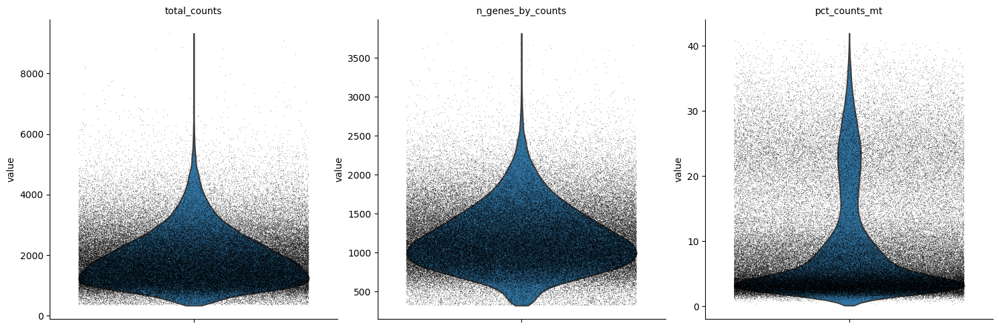

In [50]:
sc.pl.violin(hd, ['total_counts', 'n_genes_by_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, size=0.5)

## Normalizzation
The total counts (number of UMIs) differ significantly between spots, influenced by both biological and technical factors. I normalize the data, based on the total UMI counts per spot to mitigate these effects

In [51]:
sc.pp.normalize_total(hd, inplace=True)
sc.pp.log1p(hd)
hd.raw = hd

## Spatially variable genes
To reduce dimensionality of our data, we can compute spatially variable genes. These are genes that show spatial variation across the tissue. This may be because differences in cell-type composition or cell-cell communication as described by  [sc-best practices](https://www.sc-best-practices.org/spatial/spatially_variable_genes.html).<br> For this i use squidpy to calculate moran statistic as well as corresponding p-values and corrected p values.

In [14]:
import squidpy as sq

In [64]:
sq.gr.spatial_neighbors(hd)

In [65]:
sq.gr.spatial_autocorr(hd, mode="moran", genes=hd.var_names) # Moran's I statistic

/usr/local/lib/python3.8/dist-packages/scanpy/metrics/_gearys_c.py:293: UserWarning: 46 variables were constant, will return nan for these.
  warnings.warn(


In [66]:
hd.uns["moranI"]

,I,pval_norm,var_norm,pval_norm_fdr_bh
Cfd,0.885451,0.0,0.000003,NaN
Kap,0.879811,0.0,0.000003,NaN
Gpx3,0.871018,0.0,0.000003,NaN
Akr1b3,0.844501,0.0,0.000003,NaN
Car3,0.842809,0.0,0.000003,NaN
...,...,...,...,...
Sox3,NaN,NaN,0.000003,NaN
Xlr5c,NaN,NaN,0.000003,NaN
Tsga8,NaN,NaN,0.000003,NaN
H2afb2,NaN,NaN,0.000003,NaN


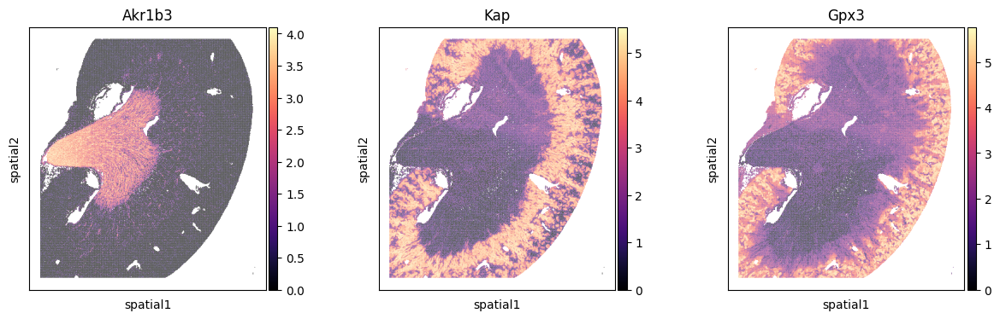

In [69]:
sc.pl.spatial(hd, color=['Akr1b3', 'Kap','Gpx3'], cmap='magma', spot_size=1)

In [71]:
hd.write_h5ad('Processed_with_Moran.h5ad', compression="gzip")

## Principal components on spatially variable genes
We can then compute principal components on the spatially variable genes. These components can represent gene programs active in different tissue areas

In [4]:
import anndata as ad
adata = ad.read_h5ad('Processed_with_Moran.h5ad')

In [5]:
adata.uns['log1p']["base"] = None

In [4]:
svg = adata.uns["moranI"][adata.uns["moranI"].I>0.3].index.to_list()
adata.var['highly_variable'] = adata.var_names.isin(svg)

In [5]:
adata.var

,gene_ids,feature_types,genome,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_variable
Xkr4,ENSMUSG00000051951,Gene Expression,mm10,False,69,0.000555,0.000555,99.945288,70.0,4.262680,False
Rp1,ENSMUSG00000025900,Gene Expression,mm10,False,150,0.001221,0.001220,99.881060,154.0,5.043425,False
Sox17,ENSMUSG00000025902,Gene Expression,mm10,False,5314,0.053000,0.051643,95.786352,6684.0,8.807622,False
Lypla1,ENSMUSG00000025903,Gene Expression,mm10,False,34648,0.397513,0.334694,72.526444,50132.0,10.822434,False
Tcea1,ENSMUSG00000033813,Gene Expression,mm10,False,29317,0.275457,0.243305,76.753572,34739.0,10.455647,False
...,...,...,...,...,...,...,...,...,...,...,...
mt-Nd4,ENSMUSG00000064363,Gene Expression,mm10,True,118009,10.758996,2.464619,6.426725,1356860.0,14.120685,True
mt-Nd5,ENSMUSG00000064367,Gene Expression,mm10,True,116200,8.159419,2.214783,7.861142,1029017.0,13.844115,True
mt-Nd6,ENSMUSG00000064368,Gene Expression,mm10,True,39688,0.434789,0.361018,68.530060,54833.0,10.912066,False
mt-Cytb,ENSMUSG00000064370,Gene Expression,mm10,True,123553,22.153473,3.142145,2.030702,2793863.0,14.842937,True


In [6]:
adata.var['highly_variable'].value_counts()

False    18742
True       317
Name: highly_variable, dtype: int64

In [7]:
sc.pp.scale(adata)
sc.pp.pca(adata, n_comps=50, use_highly_variable=True)

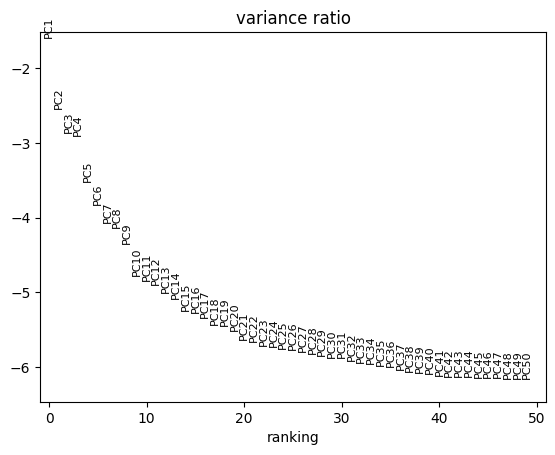

In [8]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [9]:
adata.obsm['X_pca'].shape

(122791, 50)

In [10]:
# adds values of PCs as columns to adata.obs
adata.obs = adata.obs.join(pd.DataFrame(adata.obsm['X_pca'], index=adata.obs.index, columns=['PC'+str(x+1) for x in np.arange(adata.varm['PCs'].shape[1])]))

### Visualization of the top components

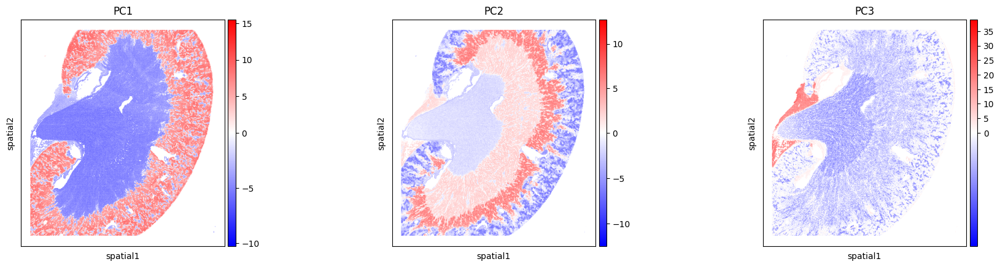

In [11]:
sc.pl.spatial(adata, color=['PC1', 'PC2', 'PC3'], cmap='bwr', vcenter=0, spot_size=1)

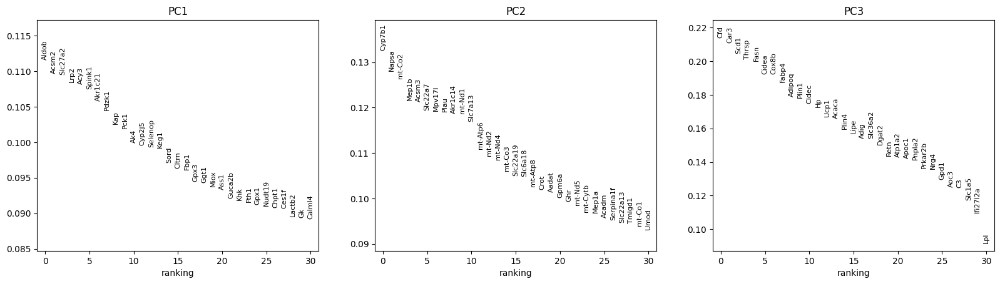

In [12]:
sc.pl.pca_loadings(adata, include_lowest=False)

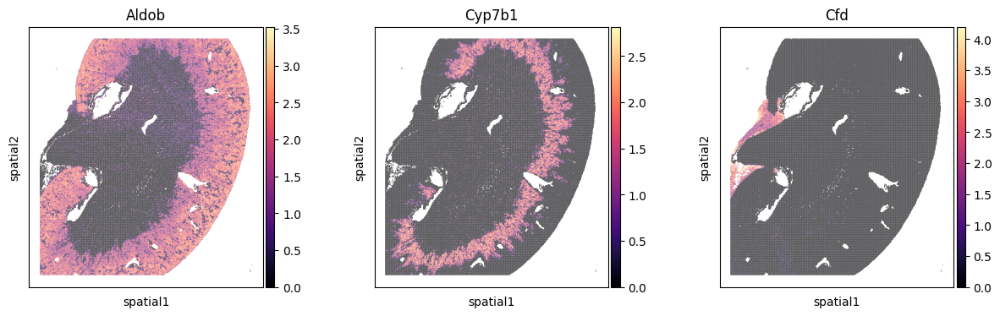

In [97]:
sc.pl.spatial(hd, color=['Aldob', 'Cyp7b1','Cfd'], cmap='magma', spot_size=1)

## Spatial Domains
We can cluster our data spatially to compute spatial patterns. These could maybe represent cell types.

In [2]:
import squidpy as sq

In [9]:
# nearest neighbor graph
sc.pp.neighbors(adata, use_rep='X_pca')
nn_graph_genes = adata.obsp["connectivities"]

# spatial proximity graph
sq.gr.spatial_neighbors(adata)
nn_graph_space = adata.obsp["spatial_connectivities"]

2024-11-20 16:23:17.354309: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/R/lib:/usr/local/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/java-11-openjdk-amd64/lib/server:/.singularity.d/libs
2024-11-20 16:23:17.354351: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [11]:
# cluster using leiden with weight alpha for each graph
alpha = 0.2

joint_graph = (1 - alpha) * nn_graph_genes + alpha * nn_graph_space
sc.tl.leiden(adata, resolution=0.5, adjacency=joint_graph, key_added="spatial_domains")

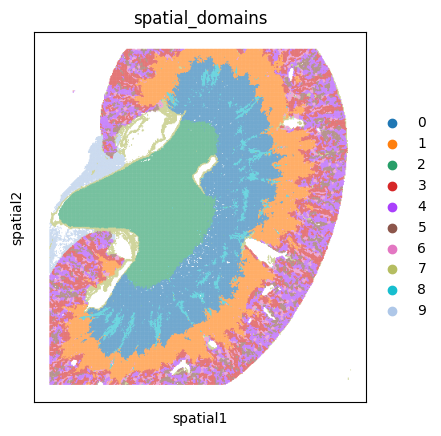

In [12]:
sc.pl.spatial(adata, color=["spatial_domains"], spot_size=1)

In [20]:
adata.raw

We can now compute marker genes for these spatial domains to help us map them to actual tissue cell type and also functonally annotate them

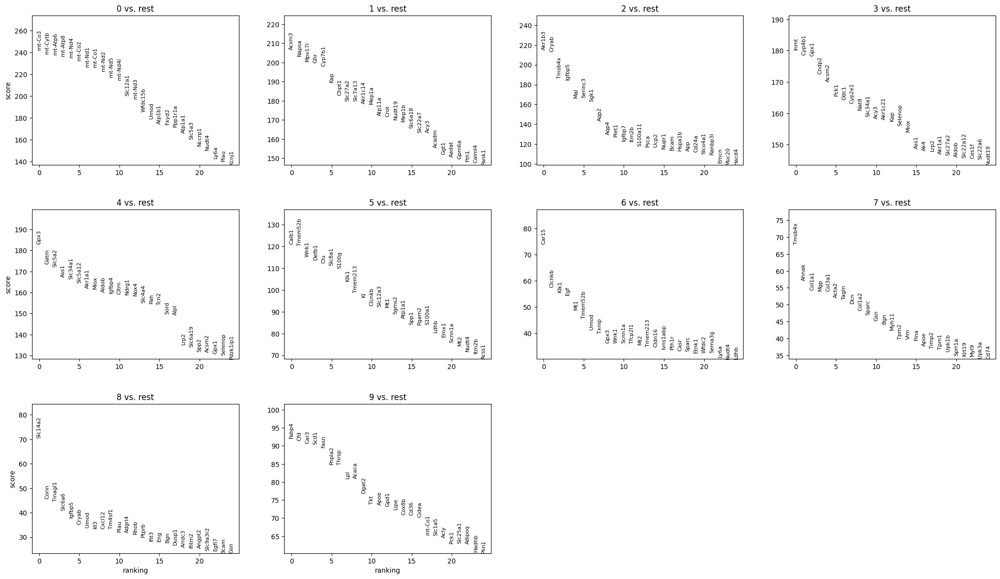

In [13]:
sc.tl.rank_genes_groups(adata, 'spatial_domains', method='wilcoxon', use_raw=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

### Visualization of the top marker gene in each cluster (spatial domain)

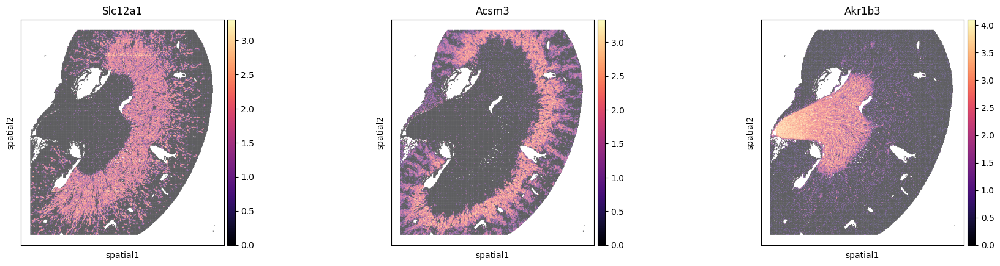

In [16]:
sc.pl.spatial(adata, color=['Slc12a1', 'Acsm3','Akr1b3'], cmap='magma', spot_size=1)

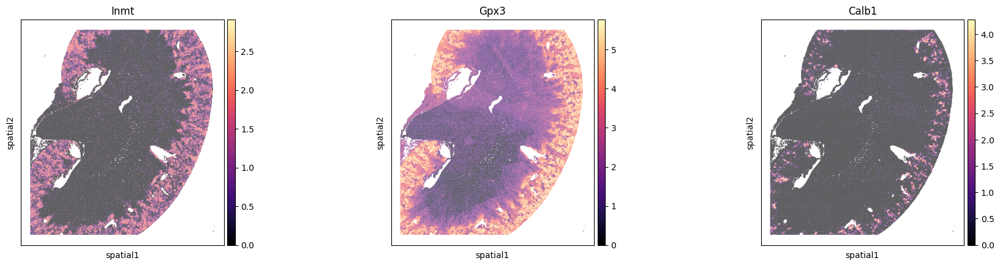

In [17]:
sc.pl.spatial(adata, color=['Inmt', 'Gpx3','Calb1'], cmap='magma', spot_size=1)

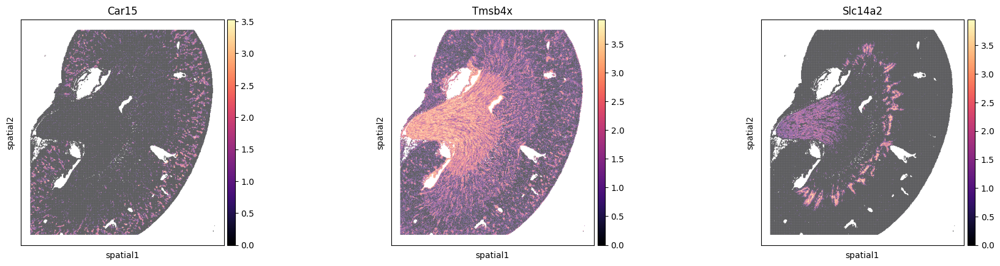

In [19]:
sc.pl.spatial(adata, color=['Car15', 'Tmsb4x','Slc14a2'], cmap='magma', spot_size=1)

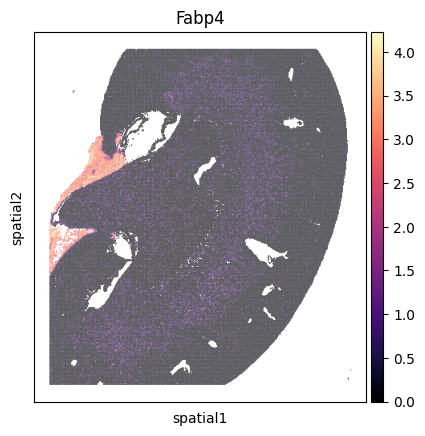

In [20]:
sc.pl.spatial(adata, color=['Fabp4'], cmap='magma', spot_size=1)

In [21]:
adata.write_h5ad('Processed_with_SpatialDomains.h5ad', compression="gzip")

## Annotation of the clusters
With the help of kidney cell type specifc marker genes  from [panglaoDB](https://panglaodb.se/) and top marker genes found in my analysis, i can map the clusters to cell types

In [22]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import os

In [23]:
adata = ad.read_h5ad('Processed_with_SpatialDomains.h5ad')
adata.uns['log1p']["base"] = None

In [24]:
# from PanglaoDb
marker_genes = {
    'Distal_Tubule_Cells': ['KCNJ16','WNK1', 'WNK4'], 
    'Intercalated_Cells' :['DMRT2', 'AVPR1A', 'OXGR1', 'ATP6V0D2', 'ATP6V1G3', 'ATP6V1C2', 'AQP6', 'SLC4A8', 'ATP6V1B1', ''], 
    'Juxtaglomerular': ['REN1'], 
    'Kidney_Progenitor_Cells' : [],
    'Loop_of_Henle_Cells': ['ARC', 'CLDN16', 'ENC1', 'SPSB1', 'ARID5A', 'SLC14A2', 'RNF182', 'NEK6', 'KCNT1', 'LIPG'],
    'Mesangial_Cells' : ['ARID5B', 'PAWR', 'SERPINE2', 'MAP3K20', 'ACTN1', 'ROCK1', 'SH3BGRL', 'FLNA', 'MEF2C', 'SMARCA5'], 
    'Podocytes' : ['BCAM', 'NPHS2', 'KANK1', 'NPR3', 'NEBL', 'FAT1', 'IQGAP2', 'QK', 'GOLIM4', 'CD2AP', 'ETF1', 'EMC7', 'PLOD2', 'PARD3B'], 
    'Principal_Cells' : ['ACER2', 'NR3C2', 'FXYD4'],
    'Proximal_Tubule_Cells' : ['GCDH', 'GSTZ1', 'AK4', 'MIOX', 'GLYAT', 'FBP1', 'FAH', 'HGD', 'ECI3', 'CRYL1', 'KEG1'], 
    'Transient_Cells' : ['SYT7', 'PARM1']
}
for ct, genes in marker_genes.items():
    print(f'{ct}: {len(genes)}')

Distal_Tubule_Cells: 3
Intercalated_Cells: 10
Juxtaglomerular: 1
Kidney_Progenitor_Cells: 0
Loop_of_Henle_Cells: 10
Mesangial_Cells: 10
Podocytes: 14
Principal_Cells: 3
Proximal_Tubule_Cells: 11
Transient_Cells: 2


In [25]:
upp2low = {}
for gene in adata.var.index:
    upp2low[gene.upper()] = gene
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in upp2low.keys():
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

In [26]:
marker_genes_in_data_low = {}
for ct, marker_list in marker_genes_in_data.items():
    marker_list_low = [upp2low[gene] for gene in marker_list]
    marker_genes_in_data_low[ct] = marker_list_low
for ct, genes in marker_genes_in_data_low.items():
    print(f'{ct}: {len(genes)}')

Distal_Tubule_Cells: 3
Intercalated_Cells: 9
Juxtaglomerular: 1
Kidney_Progenitor_Cells: 0
Loop_of_Henle_Cells: 10
Mesangial_Cells: 10
Podocytes: 14
Principal_Cells: 2
Proximal_Tubule_Cells: 11
Transient_Cells: 2


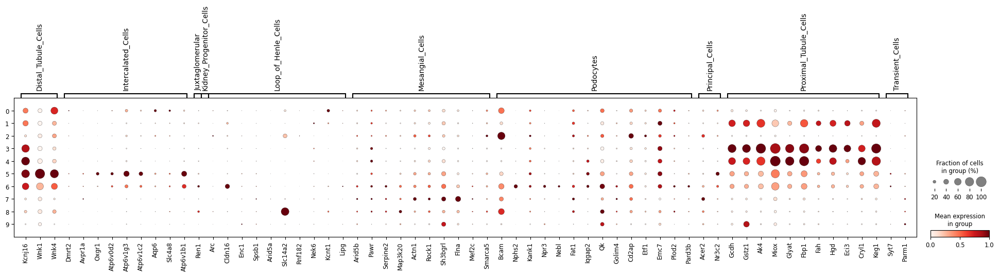

In [27]:

sc.pl.dotplot(adata, marker_genes_in_data_low, groupby="spatial_domains", standard_scale="var")

In [28]:
ct_annotation = {
    "0": "Distal_Tubule_Cells / Podocytes",
    "1": "Proximal_Tubule_Cells",
    "2": "Podocytes",
    "3": "Proximal_Tubule_Cells",
    "4": "Proximal_Tubule_Cells",
    "5": "Distal_Tubule_Cells",
    "6": "Distal_Tubule_Cells / Podocytes",
    "7": "Mesangial_Cells",
    "8": "Loop_of_Henle_Cells",
    "9": "Podocytes"
}


In [29]:
adata.obs["celltype_annotation"] = adata.obs.spatial_domains.map(ct_annotation)

In [30]:
adata.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,...,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,spatial_domains,celltype_annotation
s_016um_00052_00082-1,1752,7.469084,3016.0,8.012018,23.474801,30.868700,40.251989,58.488064,82.0,4.418840,...,0.332635,0.439013,0.725406,0.145015,-0.441581,0.500143,1.689603,0.234492,5,Distal_Tubule_Cells
s_016um_00396_00063-1,902,6.805723,1342.0,7.202661,26.378539,35.543964,47.690015,70.044709,72.0,4.290460,...,-0.926746,1.816224,1.157368,-0.379508,0.369897,0.310384,0.580849,0.274250,1,Proximal_Tubule_Cells
s_016um_00144_00175-1,965,6.873164,1244.0,7.126891,19.372990,27.411576,38.504823,62.620579,54.0,4.007333,...,-1.617941,1.036102,0.329819,0.880407,1.579285,-0.400315,-1.239083,-0.884635,2,Podocytes
s_016um_00297_00147-1,1357,7.213768,2438.0,7.799344,34.700574,41.099262,49.753897,64.848236,524.0,6.263398,...,-0.464329,-0.686750,-0.194638,-0.042487,-1.191912,-0.283651,0.461456,-0.043868,0,Distal_Tubule_Cells / Podocytes
s_016um_00299_00088-1,859,6.756932,1178.0,7.072422,27.249576,35.568761,44.057725,69.524618,213.0,5.365976,...,0.187026,-0.130425,0.224356,0.230074,-0.753803,0.269444,0.146452,-0.211050,0,Distal_Tubule_Cells / Podocytes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00375_00231-1,1093,6.997596,1878.0,7.538495,27.955272,36.847710,48.828541,68.423855,64.0,4.174387,...,0.599291,1.255126,-1.247147,0.363508,0.659276,0.474871,1.547595,0.793856,3,Proximal_Tubule_Cells
s_016um_00109_00223-1,760,6.634633,1101.0,7.004882,30.881017,39.963669,49.137148,76.385104,215.0,5.375278,...,1.228054,-0.765446,0.288001,2.215575,-0.347743,-1.555720,-1.368722,0.920044,0,Distal_Tubule_Cells / Podocytes
s_016um_00039_00175-1,1522,7.328437,2220.0,7.705713,21.486486,27.567568,36.576577,53.963964,266.0,5.587249,...,-0.008294,0.453632,-0.455301,0.260559,-0.018601,-1.345522,0.265627,-1.329534,0,Distal_Tubule_Cells / Podocytes
s_016um_00037_00193-1,759,6.633318,867.0,6.766191,15.686275,23.990773,35.524798,70.126874,23.0,3.178054,...,0.282335,0.611469,-1.009012,-1.009217,0.489167,0.041314,0.784202,0.682716,8,Loop_of_Henle_Cells


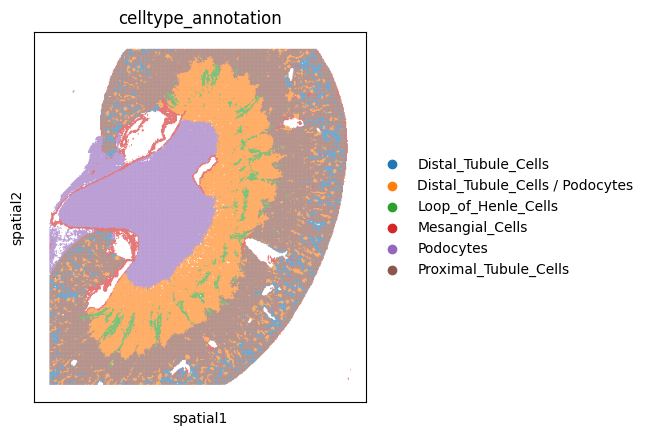

In [31]:
sc.pl.spatial(adata, color=["celltype_annotation"], spot_size=1)

In [32]:
adata.write_h5ad('Processed_with_SpatialDomains&Annotation.h5ad', compression="gzip")

# Functional Analysis
In this section, my aim is to find significantly enriched biological pathways in my clusters. I do this by using GOrilla.

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad

In [34]:
adata = ad.read_h5ad('Processed_with_SpatialDomains&Annotation.h5ad')
adata.uns['log1p']["base"] = None

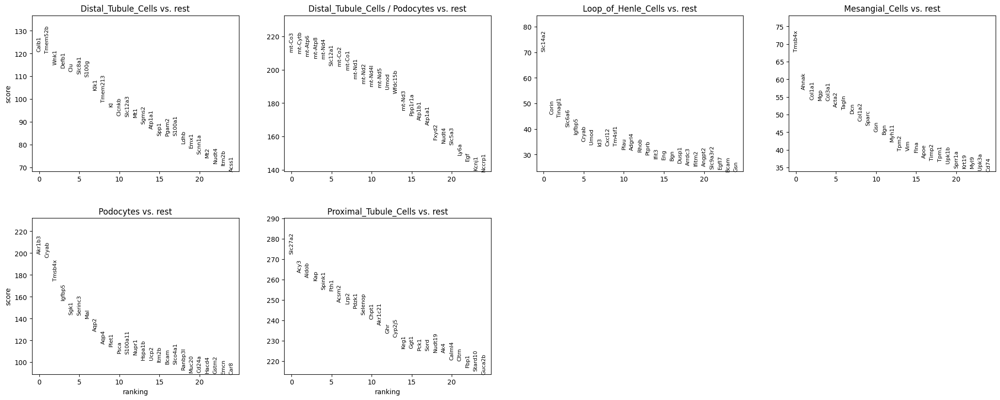

In [35]:
sc.tl.rank_genes_groups(adata, 'celltype_annotation', method='wilcoxon', use_raw=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [5]:
cell_types = list(adata.obs['celltype_annotation'].unique())
for cell_type in cell_types:
    df = sc.get.rank_genes_groups_df(adata, group=cell_type)
    df = df[~df['logfoldchanges'].isna()]
    df = df[df['pvals_adj'] < 0.05]
    df_ranked = df.sort_values(by='logfoldchanges', ascending=False)
    df_up = df[df['logfoldchanges'] > 1]
    df_down = df[df['logfoldchanges'] < -1]
    filename_up = f"{cell_type.replace(' / ', '-')}_up.txt"
    filename_down  = f"{cell_type.replace(' / ', '-')}_down.txt"
    filename_rank = f"{cell_type.replace(' / ', '-')}.rnk"
    df_up['names'].to_csv(filename_up, sep = '\t', index = False, header = False)
    df_down['names'].to_csv(filename_down, sep = '\t', index = False, header = False)
    df_ranked['names'].to_csv(filename_rank, sep = '\t', index = False, header = False)

In [84]:
adata.write_h5ad('Processed_with_rank_genes.h5ad', compression="gzip")

## GORilla
I am using GORilla to find the enriched GO terms in each cell type. GORilla requires a ranked gene list. The genes for my analysis were ranked based on logfold change

### Distal Tubule Cells / Podocytes
Genes enriched in this cell type are genes mostly involved in ion transport , regulation of ion transport and homeostasis.

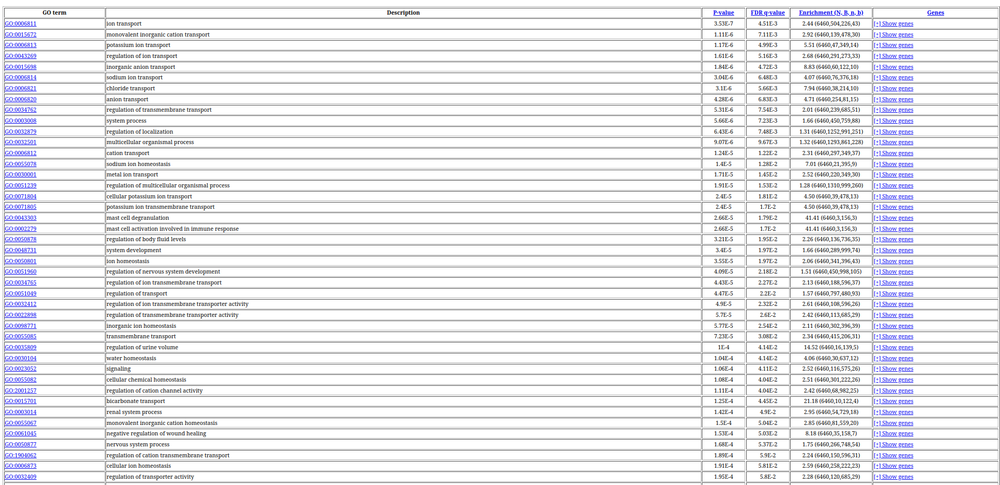

### Distal Tubule Cells
Genes enriched in this cell type are also involved in ion transport and transmembrane transport. The most significantly enriched genes are genes involved in cation transmembrane transport. 

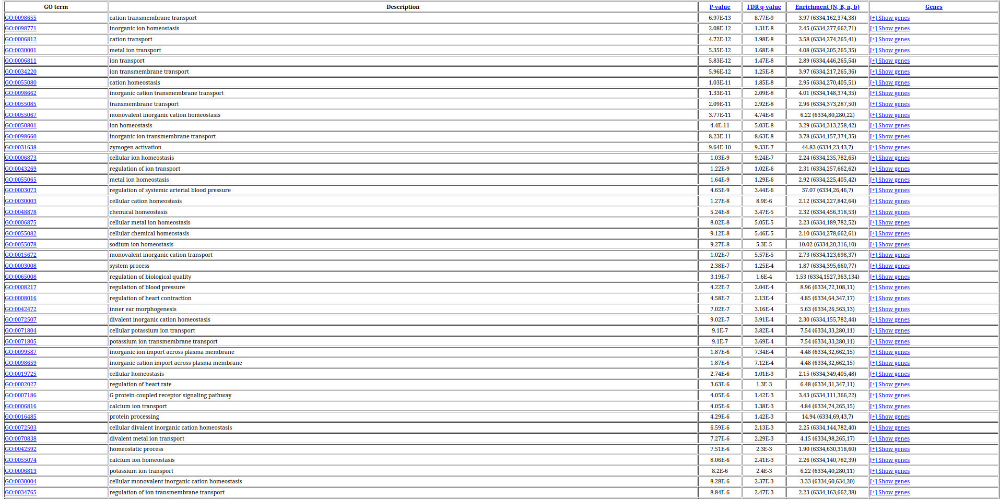

###  Loop of Henle Cells
Genes enriched in this cell type are involved in the regulation of cellular , biological and developmental process 

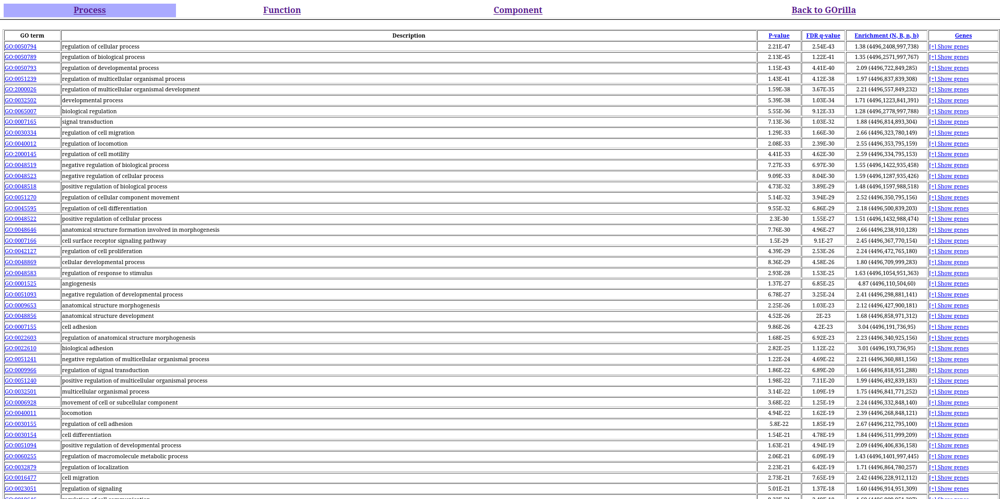

### Mensangial_Cells
Genes enriched in this cell type are involved in extracellular matrix and structure organisation and also developmental process 

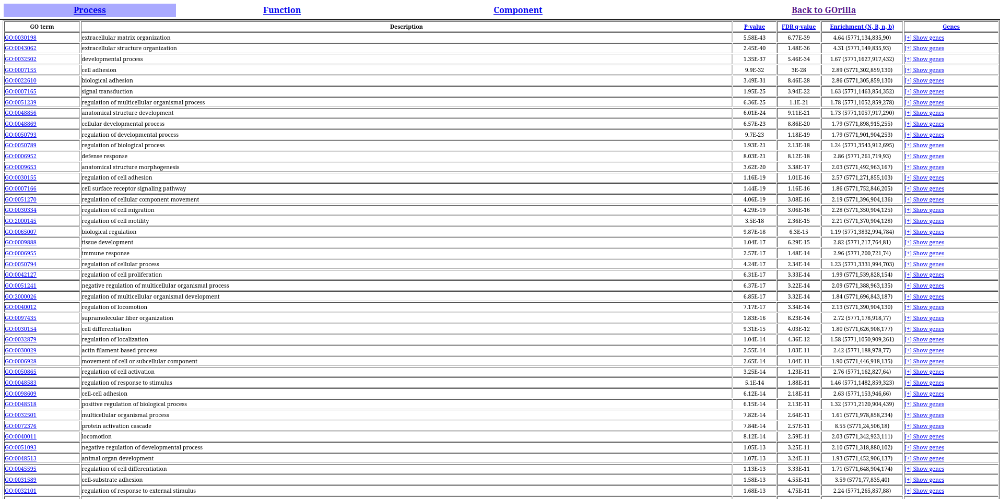

### Podocytes
Genes enriched in Podocytes are involved in regulation of multicellular organismal process, cell-cell signaling and adhesion.

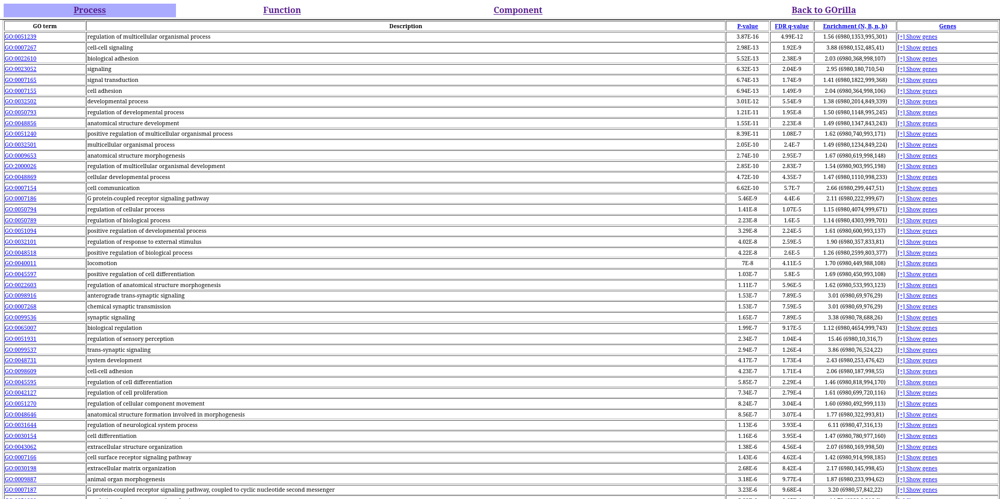

### Proximal Tubule Cells
Genes enriched in this cell type are mostly involved in metabolic processes  

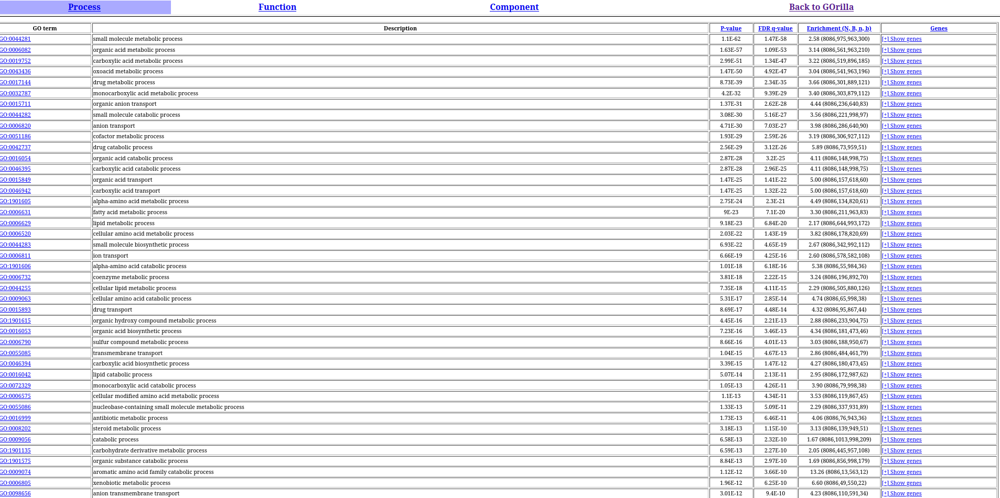

# Neighborhood Enrichment
This neighborhood enrichment analysis provides insights into the spatial relationships between different cell types within the tissue. The heatmap shows enrichment scores, which quantify the likelihood of cell types being spatially co-located compared to random expectation. <br>
**Discussion** <br>
Podocytes appear to be restricted to distinct regions, while Proximal Tubule Cells form widespread, larger contiguous areas. These spatial patterns align with the known architecture of kidney tissue. The positive enrichment between Distal Tubule Cells and Distal Tubule Cells / Podocytes is consistent with their anatomical and functional proximity within the nephron. Podocytes are located around the glomeruli, which are spatially adjacent to Distal Tubule Cells. On the other hand, the negative enrichment between Mesangial Cells and Proximal Tubule Cells highlights their spatial segregation, as Mesangial Cells are confined to the glomerular regions, while Proximal Tubule Cells form tubular structures that extend outward.

In [4]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import squidpy as sq

In [5]:
adata = ad.read_h5ad('Processed_with_rank_genes.h5ad')
adata.uns['log1p']["base"] = None

  0%|          | 0/1000 [00:00<?, ?/s]

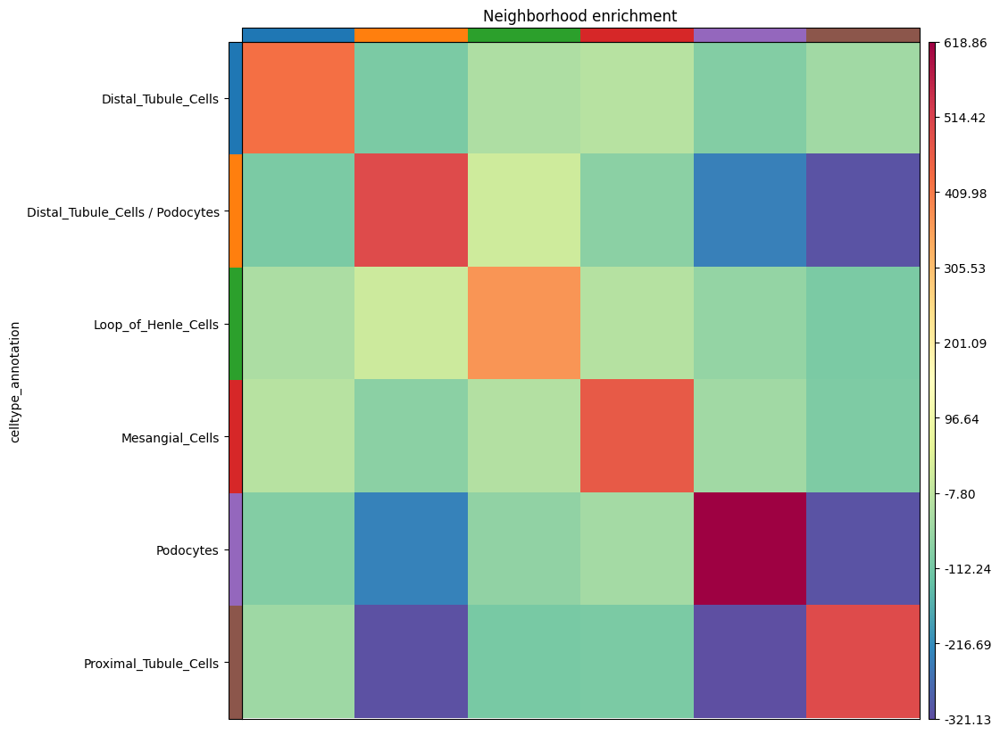

In [12]:
sq.gr.nhood_enrichment(adata, cluster_key="celltype_annotation")
sq.pl.nhood_enrichment(adata, cluster_key="celltype_annotation" ,figsize=(8,8), cmap='Spectral_r')

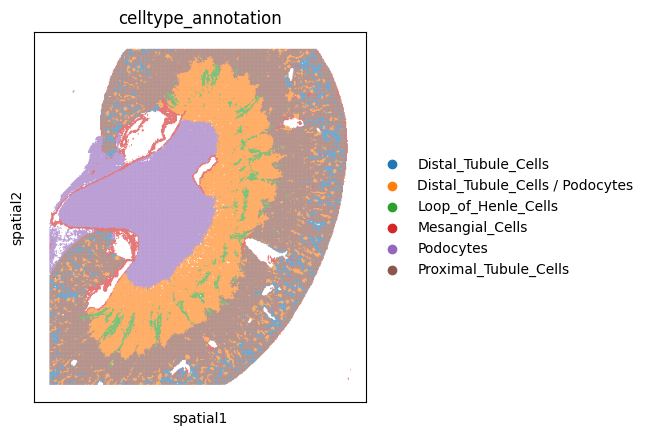

In [6]:
sc.pl.spatial(adata, color=["celltype_annotation"], spot_size=1)

# Conclusion
Spatial transcriptomics analysis of the mouse kidney revealed distinct spatial domains enriched for specific cell types and associated biological functions. This analysis provides valuable insights into the intricate spatial organization and cellular heterogeneity of the kidney. Future integration with scRNA-seq data will enable more precise cell type mapping and a deeper understanding of gene expression profiles within these spatial domains, with potential implications for understanding kidney development, function, and disease.